This is a EDA Project. which is about the status of riders and timings of orders on Swiggy and Zomato App. In this dataset we have data related to after ordering the food.

In [147]:
## About the Columns of the dataset:-

# order_id : unique id for each order
# order_time: time of the creation of order by the client
# order_date : date of the order
# allot_time: time of allocation of order to the rider
# accept_time: time of acceptance of the order by the rider (if available)
# pickup_time: time of pickup of the order (if available)
# delivered_time: time of delivery of the order (if available)
# cancelled_time: time of cancellation of order (if the order was cancelled)
# cancelled: whether the order was cancelled
# rider_id: unique id for each rider
# first_miledistance: road distance fromdistance: road distance from rider’s location to the pickup location
# last_miledistance: road distance from pickup location to the delivery location
# allotted_orders: total number of orders allotted to the rider in the 30 days before (not including) orderdate
# deliveredorders: total number of orders delivered by the rider in the 30 days before (not including) orderdate
# undelivered_orders: total number of orders allotted to but not delivered by the rider (i.e. cancelled) in the 30 days before (not including) orderdate
# lifetime_ordercount: total number of orders delivered by the rider at any time before orderdate
# reassigned_order: whether the order was reassigned to this rider
# reassignment_method: if the order was reassigned, whether the reassignment was done manually (by the ops team) or automatically
# reassignment_reason: a more detailed reason for the reassignment
# session_time: total time the rider had been online on orderdate before ordertime

In [148]:

import pandas as pd
import numpy as np
import plotly.express as px
import plotly as py
import matplotlib.pyplot as plt 
import seaborn as sns 

import datetime as dt  # To convert the dtypes of Dates
from datetime import datetime, timedelta
from datetime import time

py.offline.init_notebook_mode(connected = True)
#filter out warning
import warnings
warnings.filterwarnings("ignore")

In [149]:
# Setting the plot size and the style of grid.
sns.set_style("darkgrid")
plt.rcParams['font.size']=15
plt.rcParams['figure.figsize']= (9,7)
plt.rcParams['figure.facecolor']='#FFE5B4'

In [150]:
df= pd.read_csv(r"C:\Users\abhis\Downloads\archive (29)\Rider-Info.csv")

In [151]:
df.info()  # To check the data type

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450000 entries, 0 to 449999
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_time            450000 non-null  object 
 1   order_id              450000 non-null  int64  
 2   order_date            450000 non-null  object 
 3   allot_time            450000 non-null  object 
 4   accept_time           449843 non-null  object 
 5   pickup_time           447579 non-null  object 
 6   delivered_time        444782 non-null  object 
 7   rider_id              450000 non-null  int64  
 8   first_mile_distance   450000 non-null  float64
 9   last_mile_distance    450000 non-null  float64
 10  alloted_orders        433052 non-null  float64
 11  delivered_orders      432659 non-null  float64
 12  cancelled             450000 non-null  int64  
 13  undelivered_orders    432659 non-null  float64
 14  lifetime_order_count  449947 non-null  float64
 15  

In [152]:
df.head()

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,delivered_orders,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time
0,2021-01-26 02:21:35,556753,2021-01-26 00:00:00,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,46.0,46.0,0,0.0,621.0,NaN,NaN,NaN,NaN,NaN
1,2021-01-26 02:33:16,556754,2021-01-26 00:00:00,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,8.0,8.0,0,0.0,105.0,NaN,NaN,NaN,3.266667,NaN
2,2021-01-26 02:39:49,556755,2021-01-26 00:00:00,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,1.0,1.0,0,0.0,66.0,NaN,NaN,NaN,9.816667,NaN
3,2021-01-26 02:47:53,556756,2021-01-26 00:00:00,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,1.0,1.0,0,0.0,127.0,NaN,NaN,NaN,17.533333,NaN
4,2021-01-26 03:06:30,556757,2021-01-26 00:00:00,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,34.0,34.0,0,0.0,84.0,NaN,NaN,NaN,1.350000,NaN


In [153]:
df.isna().sum() # To See Is there any null valuees in the dataset

order_time                   0
order_id                     0
order_date                   0
allot_time                   0
accept_time                157
pickup_time               2421
delivered_time            5218
rider_id                     0
first_mile_distance          0
last_mile_distance           0
alloted_orders           16948
delivered_orders         17341
cancelled                    0
undelivered_orders       17341
lifetime_order_count        53
reassignment_method     436256
reassignment_reason     436247
reassigned_order        436247
session_time              3675
cancelled_time          444782
dtype: int64

Here we detected that the data set have null values in certain columns. I Want to know Why? so I checked Does other columns have any relation with this Null values?

In [154]:
df['cancelled'].value_counts() # To see whether cancelled order causing other columns to have Nan values.

0    444782
1      5218
Name: cancelled, dtype: int64

In [155]:
print('So the total cancelled Orders are : {}'.format(sum(df['cancelled']==1)))
print('So the total Delivered Orders are : {}'.format(sum(df['cancelled']==0)))

So the total cancelled Orders are : 5218
So the total Delivered Orders are : 444782


In [156]:
print("Here we can see the number of NaN values in the delivered_time which is", format( df['delivered_time'].isna().sum())) 
print("Equal to the Cancelled orders value of ",format(df['cancelled'].value_counts()[1]))

Here we can see the number of NaN values in the delivered_time which is 5218
Equal to the Cancelled orders value of  5218


In [157]:
df[df['cancelled']==1]

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,delivered_orders,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time
20,2021-01-26 03:28:13,556773,2021-01-26 00:00:00,2021-01-26 04:09:50,2021-01-26 04:11:06,NaN,NaN,12885,2.8438,6.81,29.0,29.0,1,0.0,449.0,auto,Reassignment Request from SE portal.,1.0,NaN,2021-01-26 04:51:46
68,2021-01-26 03:45:17,556821,2021-01-26 00:00:00,2021-01-26 03:45:18,2021-01-26 03:46:41,NaN,NaN,17557,0.8617,2.63,13.0,13.0,1,0.0,168.0,NaN,NaN,NaN,5.000000,2021-01-26 04:08:50
100,2021-01-26 03:54:11,556853,2021-01-26 00:00:00,2021-01-26 05:29:06,2021-01-26 05:30:01,NaN,NaN,2391,2.9217,5.20,118.0,114.0,1,4.0,860.0,auto,Reassignment Request from SE portal.,1.0,22.516667,2021-01-26 05:45:51
163,2021-01-26 04:11:37,556916,2021-01-26 00:00:00,2021-01-26 04:12:30,2021-01-26 04:12:42,NaN,NaN,15229,2.1287,0.45,55.0,52.0,1,3.0,256.0,NaN,NaN,NaN,92.916667,2021-01-26 05:10:15
295,2021-01-26 04:39:16,557048,2021-01-26 00:00:00,2021-01-26 04:39:50,2021-01-26 04:40:02,NaN,NaN,2373,1.6053,4.84,104.0,104.0,1,0.0,3282.0,NaN,NaN,NaN,9.833333,2021-01-26 04:40:46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449738,2021-02-06 09:50:15,129969,2021-02-06 00:00:00,2021-02-06 10:42:09,2021-02-06 10:42:47,NaN,NaN,3027,1.7963,2.00,215.0,214.0,1,1.0,975.0,auto,Reassign,1.0,88.983333,2021-02-06 11:05:48
449922,2021-02-06 09:59:19,130153,2021-02-06 00:00:00,2021-02-06 10:00:14,2021-02-06 10:01:18,2021-02-06 10:19:22,NaN,2344,2.2022,2.56,89.0,88.0,1,1.0,176.0,NaN,NaN,NaN,174.616667,2021-02-06 11:13:48
449928,2021-02-06 09:59:27,130159,2021-02-06 00:00:00,2021-02-06 09:59:28,2021-02-06 10:00:07,2021-02-06 10:09:37,NaN,11998,1.6601,7.50,314.0,312.0,1,2.0,437.0,NaN,NaN,NaN,282.183333,2021-02-06 10:45:49
449932,2021-02-06 09:59:40,130163,2021-02-06 00:00:00,2021-02-06 10:04:41,NaN,NaN,NaN,2583,0.9083,8.39,106.0,106.0,1,0.0,133.0,NaN,NaN,NaN,28.700000,2021-02-06 10:04:41


In [158]:
df.fillna(0,inplace=True) # To Further Investigate I'm Using 0 to fill All the Nan values

In [159]:
df.loc[df['pickup_time'].eq(0) | df['accept_time'].eq(0) | df['delivered_time'].eq(0) & df['cancelled'].eq(1)]
# theses  colums(accept_time,pickup_time,delivered_time) have NaN Values because they were Cancelled Orders.
# Here I showed At which stage customers cancelled their order 
# Between "accept_time" and "delivered_time"

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,delivered_orders,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time
20,2021-01-26 03:28:13,556773,2021-01-26 00:00:00,2021-01-26 04:09:50,2021-01-26 04:11:06,0,0,12885,2.8438,6.81,29.0,29.0,1,0.0,449.0,auto,Reassignment Request from SE portal.,1.0,0.000000,2021-01-26 04:51:46
68,2021-01-26 03:45:17,556821,2021-01-26 00:00:00,2021-01-26 03:45:18,2021-01-26 03:46:41,0,0,17557,0.8617,2.63,13.0,13.0,1,0.0,168.0,0,0,0.0,5.000000,2021-01-26 04:08:50
100,2021-01-26 03:54:11,556853,2021-01-26 00:00:00,2021-01-26 05:29:06,2021-01-26 05:30:01,0,0,2391,2.9217,5.20,118.0,114.0,1,4.0,860.0,auto,Reassignment Request from SE portal.,1.0,22.516667,2021-01-26 05:45:51
163,2021-01-26 04:11:37,556916,2021-01-26 00:00:00,2021-01-26 04:12:30,2021-01-26 04:12:42,0,0,15229,2.1287,0.45,55.0,52.0,1,3.0,256.0,0,0,0.0,92.916667,2021-01-26 05:10:15
295,2021-01-26 04:39:16,557048,2021-01-26 00:00:00,2021-01-26 04:39:50,2021-01-26 04:40:02,0,0,2373,1.6053,4.84,104.0,104.0,1,0.0,3282.0,0,0,0.0,9.833333,2021-01-26 04:40:46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449738,2021-02-06 09:50:15,129969,2021-02-06 00:00:00,2021-02-06 10:42:09,2021-02-06 10:42:47,0,0,3027,1.7963,2.00,215.0,214.0,1,1.0,975.0,auto,Reassign,1.0,88.983333,2021-02-06 11:05:48
449922,2021-02-06 09:59:19,130153,2021-02-06 00:00:00,2021-02-06 10:00:14,2021-02-06 10:01:18,2021-02-06 10:19:22,0,2344,2.2022,2.56,89.0,88.0,1,1.0,176.0,0,0,0.0,174.616667,2021-02-06 11:13:48
449928,2021-02-06 09:59:27,130159,2021-02-06 00:00:00,2021-02-06 09:59:28,2021-02-06 10:00:07,2021-02-06 10:09:37,0,11998,1.6601,7.50,314.0,312.0,1,2.0,437.0,0,0,0.0,282.183333,2021-02-06 10:45:49
449932,2021-02-06 09:59:40,130163,2021-02-06 00:00:00,2021-02-06 10:04:41,0,0,0,2583,0.9083,8.39,106.0,106.0,1,0.0,133.0,0,0,0.0,28.700000,2021-02-06 10:04:41


In [160]:
df[df['delivered_orders'].eq(0) & df['alloted_orders'].eq(0) & df['undelivered_orders'].eq(0)]  
#The Riders of these orders were in break for last 30 Days because the columns of 'allowed_orders','delivered_orders','undelivered_orders' have Nan values  alltogether.
# since these columns count the total no. of Order received, delivered , and undelivered orders in a month. so the Emppty values mean these riders were inactive for 1 month.

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,delivered_orders,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time
9,2021-01-26 03:15:18,556762,2021-01-26 00:00:00,2021-01-26 03:21:27,2021-01-26 03:22:04,2021-01-26 04:14:56,2021-01-26 04:38:39,21037,2.878600,2.61,0.0,0.0,0,0.0,1.0,auto,Reassignment Request from SE portal.,1.0,0.000000,0
56,2021-01-26 03:43:20,556809,2021-01-26 00:00:00,2021-01-26 03:43:29,2021-01-26 03:48:37,2021-01-26 04:09:36,2021-01-26 04:32:50,15857,1.022900,2.36,0.0,0.0,0,0.0,118.0,0,0,0.0,3.033333,0
83,2021-01-26 03:49:16,556836,2021-01-26 00:00:00,2021-01-26 03:49:46,2021-01-26 03:49:49,2021-01-26 04:03:10,2021-01-26 04:20:28,18198,0.035973,4.72,0.0,0.0,0,0.0,281.0,0,0,0.0,19.266667,0
131,2021-01-26 04:01:22,556884,2021-01-26 00:00:00,2021-01-26 04:02:15,2021-01-26 04:02:29,2021-01-26 04:14:12,2021-01-26 04:23:30,11122,2.171200,1.69,0.0,0.0,0,0.0,52.0,0,0,0.0,6.466667,0
136,2021-01-26 04:02:59,556889,2021-01-26 00:00:00,2021-01-26 04:06:19,2021-01-26 04:06:51,2021-01-26 04:22:32,2021-01-26 04:30:47,21045,2.745600,1.15,0.0,0.0,0,0.0,17.0,0,0,0.0,0.350000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449768,2021-02-06 09:51:17,129999,2021-02-06 00:00:00,2021-02-06 09:51:42,2021-02-06 09:53:05,2021-02-06 10:04:01,2021-02-06 10:23:04,10883,1.560300,3.67,0.0,0.0,0,0.0,37.0,0,0,0.0,381.283333,0
449855,2021-02-06 09:55:05,130086,2021-02-06 00:00:00,2021-02-06 09:55:06,2021-02-06 09:55:33,2021-02-06 10:11:42,2021-02-06 10:23:14,3489,1.108500,1.20,0.0,0.0,0,0.0,94.0,0,0,0.0,264.350000,0
449929,2021-02-06 09:59:28,130160,2021-02-06 00:00:00,2021-02-06 10:00:14,2021-02-06 10:01:10,2021-02-06 10:08:33,2021-02-06 10:20:01,3100,0.096711,0.93,0.0,0.0,0,0.0,28.0,0,0,0.0,209.466667,0
449933,2021-02-06 09:59:41,130164,2021-02-06 00:00:00,2021-02-06 10:00:40,2021-02-06 10:09:32,2021-02-06 10:13:40,2021-02-06 10:22:08,13213,1.197200,0.00,0.0,0.0,0,0.0,7.0,0,0,0.0,17.083333,0


In [161]:
df['order_time']=pd.to_datetime(df['order_time'],errors='coerce') # To convert the columns into datetime data type.
df['cancelled_time']=pd.to_datetime(df['cancelled_time'],errors='coerce')

In [162]:
cancelled_Orders=df[df['cancelled']==1] # Creating a new dataframe which contains all the cancelled orders

In [163]:
# subtracting the "cancelled_time" order from "order_time" column to get the time it took to get the order cancelled.
cancelled_Orders['TimeTakes2cancelled']=(cancelled_Orders['cancelled_time']-cancelled_Orders['order_time']).apply(lambda x:time(x.components[1],x.components[2],x.components[3]))

In [164]:
#  To convert the "TimeTakes2cancelled" column into datetime data type.
cancelled_Orders['TimeTakes2cancelled']=pd.to_datetime(cancelled_Orders['TimeTakes2cancelled'], format='%H:%M:%S').dt.time

In [165]:
# define the bins
bins = [0,15,30,45,60,90,180]

# add custom labels if desired
labels = ['15 Mins', '30 Mins', '45 Mins', '1 Hour','1.3 Hour','More than 1.3 Hour']

# add the bins to the dataframe
cancelled_Orders['cancel_time_groups']= pd.cut(pd.to_timedelta(cancelled_Orders['cancelled_time']-cancelled_Orders['order_time']).dt.seconds/60, bins, labels=labels, right=False)

In [166]:
del cancelled_Orders['order_date'] #since values in the Order Date are also placed in the order Time. So It dose not add any extra value.

In [167]:
print(round(cancelled_Orders['cancel_time_groups'].value_counts( normalize=True)*100))

1.3 Hour              22.0
1 Hour                20.0
45 Mins               19.0
15 Mins               15.0
30 Mins               12.0
More than 1.3 Hour    11.0
Name: cancel_time_groups, dtype: float64


In [168]:
fig = px.histogram(cancelled_Orders, x=['cancel_time_groups'],text_auto=True,title=" Distibution of 'How much time it took before the customer cancelled his/her orders'")
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':['15 Mins', '30 Mins', '45 Mins', '1 Hour','1.3 Hour','More than 1.3 Hour']})
fig.show()

In [169]:
print('{} Orders were Reassigned to the Rider.'.format((cancelled_Orders['reassignment_method']!=0).value_counts()[1]))

719 Orders were Reassigned to the Rider.


In [171]:
cancelled_Orders['cancel_time_groups'].value_counts()

1.3 Hour              1151
1 Hour                1012
45 Mins                991
15 Mins                792
30 Mins                635
More than 1.3 Hour     552
Name: cancel_time_groups, dtype: int64

In [172]:
cancelled_Orders[cancelled_Orders['reassignment_method']!=0]

,order_time,order_id,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,...,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time,TimeTakes2cancelled,cancel_time_groups
20,2021-01-26 03:28:13,556773,2021-01-26 04:09:50,2021-01-26 04:11:06,0,0,12885,2.8438,6.81,29.0,...,1,0.0,449.0,auto,Reassignment Request from SE portal.,1.0,0.000000,2021-01-26 04:51:46,01:23:33,1.3 Hour
100,2021-01-26 03:54:11,556853,2021-01-26 05:29:06,2021-01-26 05:30:01,0,0,2391,2.9217,5.20,118.0,...,1,4.0,860.0,auto,Reassignment Request from SE portal.,1.0,22.516667,2021-01-26 05:45:51,01:51:40,More than 1.3 Hour
640,2021-01-26 05:28:04,557393,2021-01-26 06:03:24,2021-01-26 06:03:41,2021-01-26 06:13:32,0,21067,2.6143,2.21,0.0,...,1,0.0,359.0,auto,Reassignment Request from SE portal.,1.0,0.000000,2021-01-26 06:50:51,01:22:47,1.3 Hour
858,2021-01-26 05:58:16,557611,2021-01-26 06:32:44,2021-01-26 06:39:06,0,0,2582,1.9509,1.04,124.0,...,1,1.0,3080.0,auto,Reassign,1.0,0.000000,2021-01-26 06:39:43,00:41:27,45 Mins
919,2021-01-26 06:04:31,557672,2021-01-26 06:13:08,2021-01-26 06:19:24,2021-01-26 06:29:41,0,21067,2.2177,1.56,0.0,...,1,0.0,359.0,auto,Reassignment Request from SE portal.,1.0,1.250000,2021-01-26 09:13:12,03:08:41,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
448144,2021-02-06 09:06:46,128375,2021-02-06 10:52:57,2021-02-06 10:53:03,0,0,13176,1.4012,3.81,10.0,...,1,0.0,186.0,auto,Reassign,1.0,182.216667,2021-02-06 10:55:29,01:48:43,More than 1.3 Hour
448558,2021-02-06 09:13:46,128789,2021-02-06 09:52:50,2021-02-06 09:58:22,0,0,12767,0.7170,2.36,0.0,...,1,0.0,13.0,auto,Reassign,1.0,195.183333,2021-02-06 10:05:47,00:52:01,1 Hour
449423,2021-02-06 09:34:08,129654,2021-02-06 10:14:29,2021-02-06 10:16:01,0,0,1971,0.7417,4.66,61.0,...,1,1.0,636.0,auto,Reassign,1.0,223.816667,2021-02-06 10:51:19,01:17:11,1.3 Hour
449701,2021-02-06 09:47:14,129932,2021-02-06 10:35:56,2021-02-06 10:36:16,0,0,12907,2.1057,1.41,33.0,...,1,2.0,54.0,auto,Reassign,1.0,159.616667,2021-02-06 10:47:46,01:00:32,1.3 Hour


In [173]:
fig = px.histogram(cancelled_Orders[cancelled_Orders['reassignment_method']!=0], x=['cancel_time_groups'],text_auto=True,title="At what time_group most Order Management System Reassigned orders")
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':['15 Mins', '30 Mins', '45 Mins', '1 Hour','1.3 Hour','More than 1.3 Hour']})
fig.show()

In [174]:
cancelled_Orders['Total_Dist_Traveled']=cancelled_Orders['first_mile_distance']+cancelled_Orders['last_mile_distance']
# I also Want to know how much distance a Rider had to travel for every cancelled order

Now lets Explore the Delivered Dataset


In [175]:
delivered_Order=df[df['cancelled']==0]
delivered_Order

,order_time,order_id,order_date,allot_time,accept_time,pickup_time,delivered_time,rider_id,first_mile_distance,last_mile_distance,alloted_orders,delivered_orders,cancelled,undelivered_orders,lifetime_order_count,reassignment_method,reassignment_reason,reassigned_order,session_time,cancelled_time
0,2021-01-26 02:21:35,556753,2021-01-26 00:00:00,2021-01-26 02:21:59,2021-01-26 02:22:08,2021-01-26 02:32:51,2021-01-26 02:49:47,11696,1.5666,2.65,46.0,46.0,0,0.0,621.0,0,0,0.0,0.000000,1970-01-01
1,2021-01-26 02:33:16,556754,2021-01-26 00:00:00,2021-01-26 02:33:57,2021-01-26 02:34:45,2021-01-26 02:50:25,2021-01-26 03:11:15,18117,2.5207,2.76,8.0,8.0,0,0.0,105.0,0,0,0.0,3.266667,1970-01-01
2,2021-01-26 02:39:49,556755,2021-01-26 00:00:00,2021-01-26 02:39:57,2021-01-26 02:40:13,2021-01-26 02:56:00,2021-01-26 03:12:46,18623,2.2074,4.80,1.0,1.0,0,0.0,66.0,0,0,0.0,9.816667,1970-01-01
3,2021-01-26 02:47:53,556756,2021-01-26 00:00:00,2021-01-26 02:48:25,2021-01-26 02:49:06,2021-01-26 03:21:51,2021-01-26 03:41:05,15945,2.1894,6.38,1.0,1.0,0,0.0,127.0,0,0,0.0,17.533333,1970-01-01
4,2021-01-26 03:06:30,556757,2021-01-26 00:00:00,2021-01-26 03:07:21,2021-01-26 03:07:57,2021-01-26 03:31:38,2021-01-26 04:00:15,17589,2.7870,4.01,34.0,34.0,0,0.0,84.0,0,0,0.0,1.350000,1970-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449995,2021-02-06 10:03:16,130226,2021-02-06 00:00:00,2021-02-06 10:03:44,2021-02-06 10:04:14,2021-02-06 10:27:29,2021-02-06 10:44:08,1006,0.5789,0.19,4.0,4.0,0,0.0,127.0,0,0,0.0,369.516667,1970-01-01
449996,2021-02-06 10:03:17,130227,2021-02-06 00:00:00,2021-02-06 10:03:18,2021-02-06 10:04:34,2021-02-06 10:22:17,2021-02-06 10:31:43,279,1.9863,1.19,81.0,81.0,0,0.0,105.0,0,0,0.0,239.133333,1970-01-01
449997,2021-02-06 10:03:18,130228,2021-02-06 00:00:00,2021-02-06 10:04:06,2021-02-06 10:04:39,2021-02-06 10:19:06,2021-02-06 10:26:56,3161,1.5944,1.61,28.0,28.0,0,0.0,1488.0,0,0,0.0,204.150000,1970-01-01
449998,2021-02-06 10:03:19,130229,2021-02-06 00:00:00,2021-02-06 10:03:19,2021-02-06 10:05:41,2021-02-06 10:20:39,2021-02-06 10:30:41,9396,2.8939,4.68,72.0,72.0,0,0.0,105.0,0,0,0.0,65.583333,1970-01-01


In [176]:
delivered_Order.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444782 entries, 0 to 449999
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   order_time            444782 non-null  datetime64[ns]
 1   order_id              444782 non-null  int64         
 2   order_date            444782 non-null  object        
 3   allot_time            444782 non-null  object        
 4   accept_time           444782 non-null  object        
 5   pickup_time           444782 non-null  object        
 6   delivered_time        444782 non-null  object        
 7   rider_id              444782 non-null  int64         
 8   first_mile_distance   444782 non-null  float64       
 9   last_mile_distance    444782 non-null  float64       
 10  alloted_orders        444782 non-null  float64       
 11  delivered_orders      444782 non-null  float64       
 12  cancelled             444782 non-null  int64         
 13 

In [180]:
delivered_Order['delivered_time']=pd.to_datetime(delivered_Order['delivered_time'],errors='coerce')

In [181]:
delivered_Order['Timetakes_to_Delivered']=(delivered_Order['delivered_time']-delivered_Order['order_time']).apply(lambda x:time(x.components[1],x.components[2],x.components[3]))

In [182]:
# add the bins to the dataframe
bins = [0,20,30,45,60,90,180,]

labels = ['20 Mins', '30 Mins', '45 Mins', '1 Hour','90 Mins','More than 90 Mins']

delivered_Order['Time_range_groups'] = pd.cut(pd.to_timedelta(delivered_Order['delivered_time']-delivered_Order['order_time']).dt.seconds/60, bins, labels=labels, right=False)

In [183]:
fig = px.histogram(delivered_Order, x=['Time_range_groups'],text_auto=True,title ="Time Takes to deliver the orders")
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':['20 Mins', '30 Mins', '45 Mins', '1 Hour','90 Mins','More than 90 Mins']})
fig.show()

In [185]:
delivered_Order['Time_range_groups'].value_counts(normalize=True)*100

30 Mins              36.360732
45 Mins              34.761036
20 Mins              16.069190
1 Hour                9.466536
90 Mins               2.880758
More than 90 Mins     0.461749
Name: Time_range_groups, dtype: float64

In [188]:
# To see how many orders get executed within 45 Mins.
print('So {}'.format(round(delivered_Order['Time_range_groups'].value_counts(normalize=True)[0:3].sum()*100)),'% of Total orders were delivered within 45 Mins.')

So 87 % of Total orders were delivered within 45 Mins.


In [189]:
#To convert the "order_time" column into datetime data type.
df['order_date']=pd.to_datetime(df['order_date'])  

<AxesSubplot:title={'center':'No of Orders by Each Day'}, ylabel='order_date'>

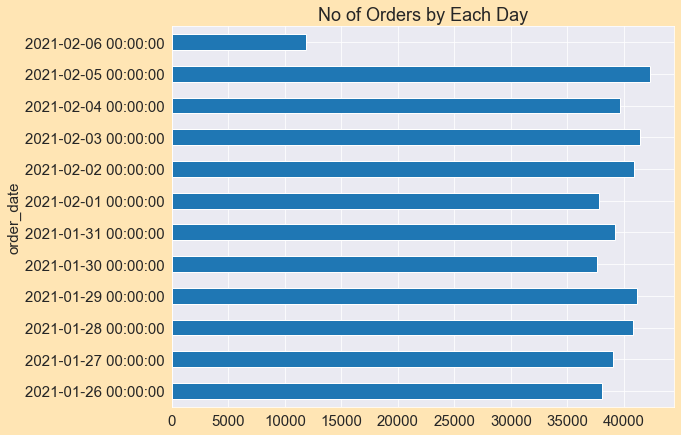

In [190]:
# To get the NO. of Tarnsaction get executed by each day
df.groupby(['order_date'])[['order_id']].count().plot(kind='barh',title='No of Orders by Each Day',legend=False)